In [1]:
#Import packages for single-cell analysis

import os, scanpy as sc, numpy as np, pandas as pd
sc.settings.verbosity = 3
sc.set_figure_params(dpi=130)

#Define file-path layout

PROJECT_ROOT = os.path.abspath(".")
DATA_DIR = os.path.join(PROJECT_ROOT, "data", "cellxgene")
OUT_DIR = os.path.join(PROJECT_ROOT, "outputs")
FIG_DIR = os.path.join(OUT_DIR, "figures")
H5AD_DIR = os.path.join(OUT_DIR, "h5ad")

#Create output directories
os.makedirs(FIG_DIR, exist_ok=True); os.makedirs(H5AD_DIR, exist_ok=True)

#Set default figure directory

sc.settings.figdir = FIG_DIR

#Define input file paths

SL040_PATH = os.path.join(DATA_DIR, "SL040.h5ad")
SL057_PATH = os.path.join(DATA_DIR, "SL057.h5ad")

#Confirm that the input data exists

print("Data present?")
print("  SL040:", os.path.exists(SL040_PATH))
print("  SL057:", os.path.exists(SL057_PATH))

Data present?
  SL040: True
  SL057: True


In [5]:
#Find which column in adata.obs represents a batch variable

def detect_batch_key(adata):
    for c in ["sample","tumor","subject","batch","donor"]:
        if c in adata.obs and adata.obs[c].nunique() > 1:
            return c
    for c in adata.obs.columns:
        if adata.obs[c].dtype.name in ("category","object") and adata.obs[c].nunique() > 1:
            return c
    return None

#Generate standard Scanpy QC plots

def qc_plots(adata, tag):
    sc.pl.violin(adata, ["n_genes_by_counts","total_counts","pct_counts_mt"],
                 jitter=0.4, multi_panel=True, save=f"_{tag}_qc_violin.png")
    sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt", save=f"_{tag}_qc_scatter_counts_vs_mt.png")
    sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", save=f"_{tag}_qc_scatter_counts_vs_genes.png")

#Run Scanpy preprocessing and integration workflow

def standard_pipeline(adata, tag, mito_thresh=15, n_hvg=4000, n_pcs=50, res=0.8, harmony_key=None):

    #Compute QC metrics and plot before filtering
    
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    qc_plots(adata, tag=f"{tag}_BEFORE")

    # Filter out low-quality or high-mito cells
    
    filt = (adata.obs.n_genes_by_counts >= 200) & (adata.obs.pct_counts_mt < mito_thresh)
    adata = adata[filt].copy()

    # Plot after filtering
    
    qc_plots(adata, tag=f"{tag}_AFTER")

    # Normalize, log-transform, and find HVGs
    
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=n_hvg, subset=True)

    # Scale genes and run PCA
    
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, n_comps=n_pcs)

    #Run Harmony batch correction

    import harmonypy as hm
    if harmony_key is None:
        harmony_key = detect_batch_key(adata) or "leiden"
    print(f"[{tag}] Harmony batch key:", harmony_key)
    ho = hm.run_harmony(adata.obsm["X_pca"], adata.obs, harmony_key)
    adata.obsm["X_pca_harmony"] = ho.Z_corr.T

    # Compute neighbors, UMAP, and Leiden clusters
    
    sc.pp.neighbors(adata, use_rep="X_pca_harmony", n_neighbors=30)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=res)

    # Save final UMAP QC plots
    
    sc.pl.umap(adata, color=["n_genes_by_counts","pct_counts_mt","leiden"], save=f"_{tag}_UMAP_qc.png")

    #Return results

    return adata, harmony_key
     

In [6]:

# Load one raw single-cell dataset (SLO40.h5ad) into memory

assert os.path.exists(SL040_PATH)
ad_sl040_raw = sc.read_h5ad(SL040_PATH)
ad_sl040_raw.var_names_make_unique()

#Print dataset dimensions and column preview

print("SL040 raw shape:", ad_sl040_raw.shape)
print("SL040 obs columns:", list(ad_sl040_raw.obs.columns)[:15])

SL040 raw shape: (135482, 58234)
SL040 obs columns: ['Fluorescence', 'Location', 'MitoFraction', 'NeftelClass', 'UnsplicedFraction', 'Zone', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'tissue_type', 'total_genes']


In [10]:
#Inspect gene names

ad_sl040_raw.var_names[:10]


Index(['ENSG00000223972', 'ENSG00000227232', 'ENSG00000278267',
       'ENSG00000284332', 'ENSG00000268020', 'ENSG00000240361',
       'ENSG00000233750', 'ENSG00000268903', 'ENSG00000269981',
       'ENSG00000241860'],
      dtype='object')

In [11]:
#Inspect column names

ad_sl040_raw.var.columns[:10]


Index(['Accession', 'Chromosome', 'End', 'Gene', 'Start',
       'feature_is_filtered', 'feature_name', 'feature_reference',
       'feature_biotype', 'feature_length'],
      dtype='object')

Number of mitochondrial genes detected: 37
count    135482.000000
mean          4.673527
std           4.379080
min           0.000000
25%           1.736914
50%           3.450395
75%           6.059514
max          25.190445
Name: pct_counts_mt, dtype: float64


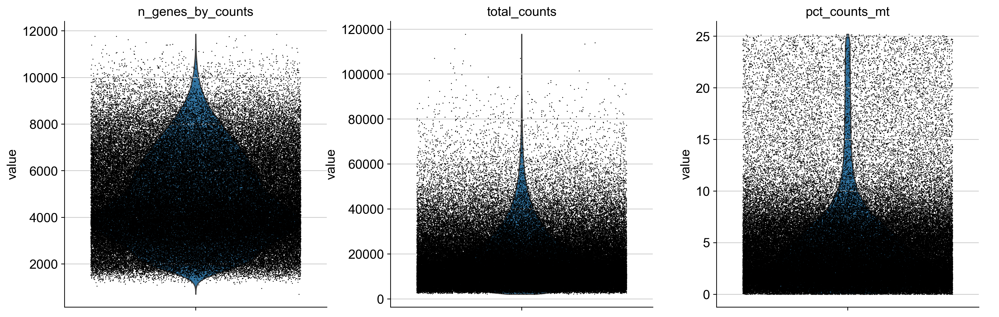

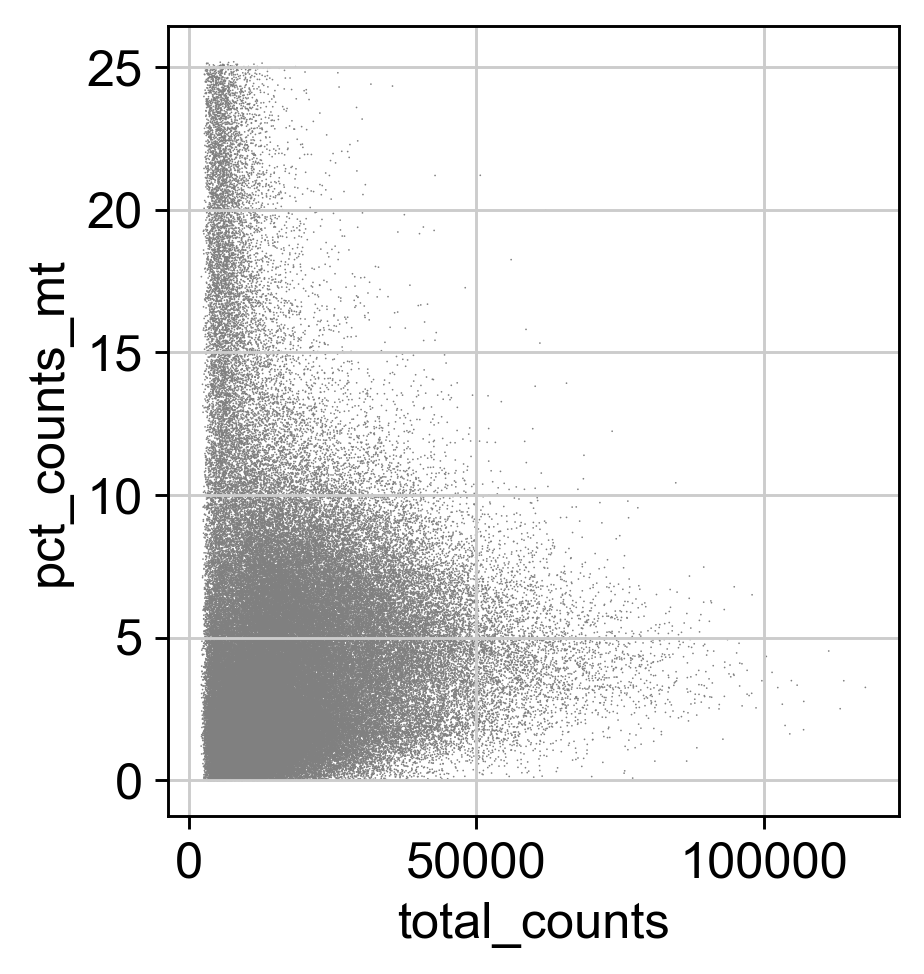

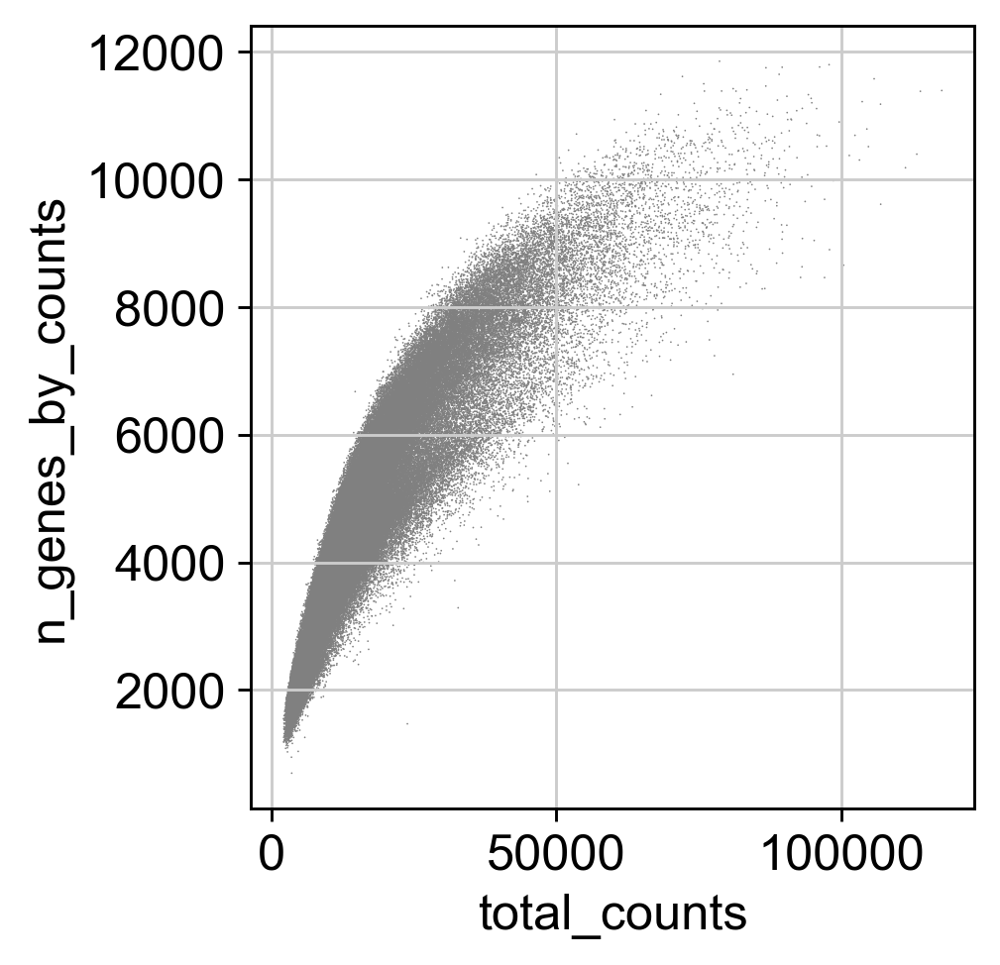

In [12]:
#Flag mitochondrial genes using gene symbols

ad_sl040_raw.var['mt'] = ad_sl040_raw.var['feature_name'].str.upper().str.startswith('MT-')
print("Number of mitochondrial genes detected:", ad_sl040_raw.var['mt'].sum())

#Recalculate per-cell QC metrics

sc.pp.calculate_qc_metrics(ad_sl040_raw, qc_vars=['mt'], inplace=True)

# Summarize distribution of mitochondrial percentages across all cells

print(ad_sl040_raw.obs['pct_counts_mt'].describe())

# Generate QC plots

qc_plots(ad_sl040_raw, tag="SL040_BEFORE_manual")


In [13]:
#Set the mitochondrial percentage cutoff to 10%

mito_thresh = 10

#Apply a filter mask

filt_mask = (ad_sl040_raw.obs.n_genes_by_counts >= 200) & (ad_sl040_raw.obs.pct_counts_mt < mito_thresh)
ad_sl040 = ad_sl040_raw[filt_mask].copy()

#Print the new dataset dimensions

print("SL040 after filter shape:", ad_sl040.shape)

SL040 after filter shape: (123329, 58234)


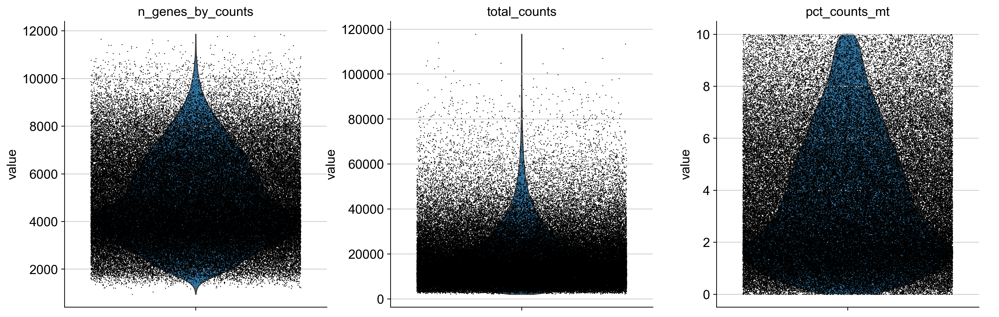

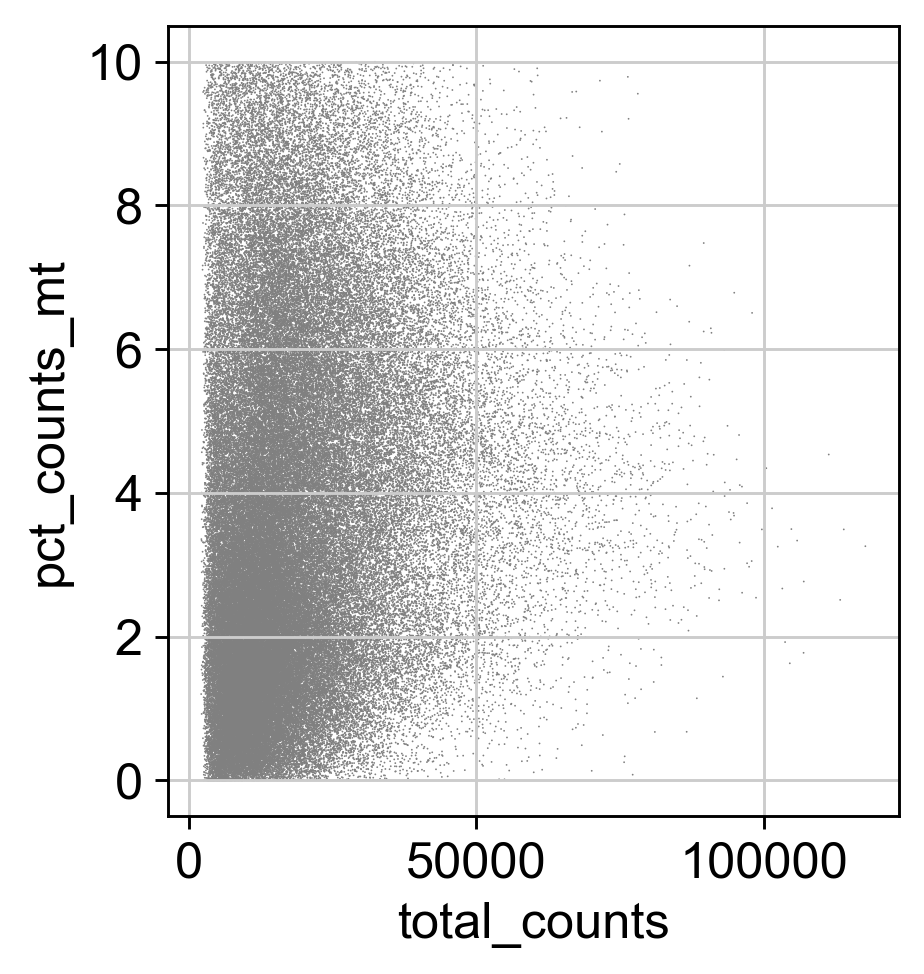

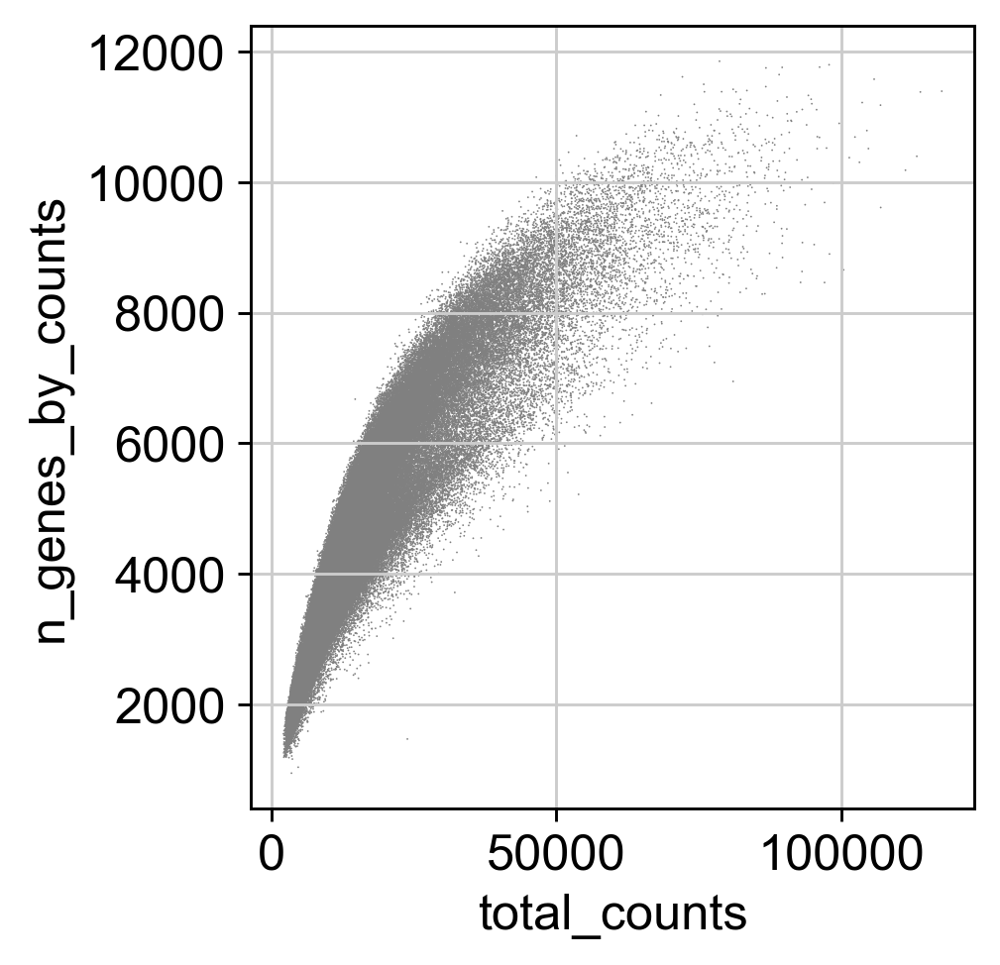

In [14]:
#Generate QC plots for filtered dataset

qc_plots(ad_sl040, tag="SL040_AFTER_manual")

normalizing counts per cell
    finished (0:00:05)
extracting highly variable genes


/Users/baileyorange/micromamba/envs/gbm_mtor/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


/Users/baileyorange/micromamba/envs/gbm_mtor/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:02:47)


2025-11-09 19:34:07,032 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-11-09 19:34:29,475 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-11-09 19:34:29,886 - harmonypy - INFO - Iteration 1 of 10
2025-11-09 19:35:01,644 - harmonypy - INFO - Iteration 2 of 10
2025-11-09 19:35:33,913 - harmonypy - INFO - Iteration 3 of 10
2025-11-09 19:36:05,200 - harmonypy - INFO - Iteration 4 of 10
2025-11-09 19:36:36,680 - harmonypy - INFO - Iteration 5 of 10
2025-11-09 19:37:08,055 - harmonypy - INFO - Iteration 6 of 10
2025-11-09 19:37:39,833 - harmonypy - INFO - Iteration 7 of 10
2025-11-09 19:38:10,888 - harmonypy - INFO - Iteration 8 of 10
2025-11-09 19:38:41,942 - harmonypy - INFO - Iteration 9 of 10
2025-11-09 19:39:13,022 - harmonypy - INFO - Converged after 9 iterations


computing neighbors


/Users/baileyorange/micromamba/envs/gbm_mtor/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:04:26)
running Leiden clustering


/var/folders/t7/vzbzd0xj40jbwddqp7614wm80000gn/T/ipykernel_67573/1341276808.py:16: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.umap(ad_sl040); sc.tl.leiden(ad_sl040, resolution=0.8)


    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:50)


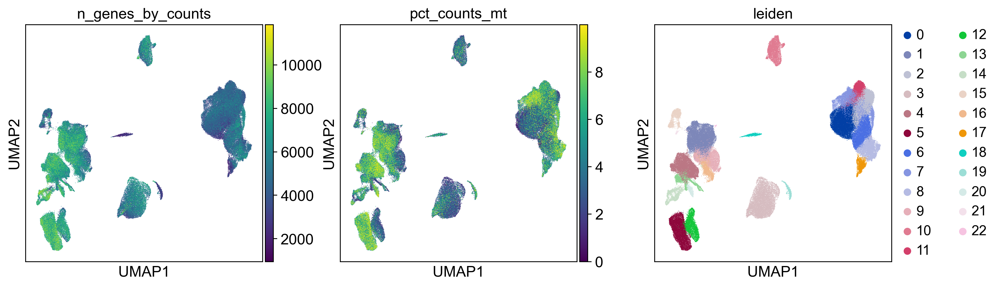

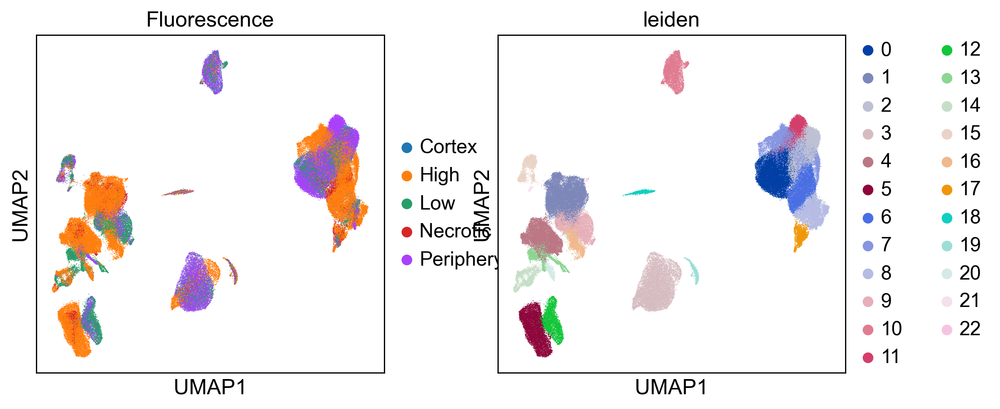

Saved: /Users/baileyorange/Desktop/GBM Project/outputs/h5ad/SL040_cleaned.h5ad


In [15]:
# Normalize and find highly variable genes

sc.pp.normalize_total(ad_sl040, target_sum=1e4)
sc.pp.log1p(ad_sl040)
sc.pp.highly_variable_genes(ad_sl040, flavor="seurat_v3", n_top_genes=4000, subset=True)

# PCA and Harmony batch correction

sc.pp.scale(ad_sl040, max_value=10)
sc.tl.pca(ad_sl040, n_comps=50)
import harmonypy as hm
key040 = detect_batch_key(ad_sl040) or "leiden"
ho040 = hm.run_harmony(ad_sl040.obsm["X_pca"], ad_sl040.obs, key040)
ad_sl040.obsm["X_pca_harmony"] = ho040.Z_corr.T

# Graph construction, UMAP, and clustering of similar cells

sc.pp.neighbors(ad_sl040, use_rep="X_pca_harmony", n_neighbors=30)
sc.tl.umap(ad_sl040); sc.tl.leiden(ad_sl040, resolution=0.8)

# Confirm clean clustering and successful batch correction

sc.pl.umap(ad_sl040, color=["n_genes_by_counts","pct_counts_mt","leiden"], save="_SL040_UMAP_qc.png")
if key040 in ad_sl040.obs:
    sc.pl.umap(ad_sl040, color=[key040,"leiden"], save="_SL040_UMAP_batchmix.png")

# Save processed dataset

sl040_out = os.path.join(H5AD_DIR, "SL040_cleaned.h5ad")
ad_sl040.write(sl040_out)
print("Saved:", sl040_out)

In [16]:
# Load one raw single-cell dataset (SL057.h5ad) into memory

assert os.path.exists(SL057_PATH)
ad_sl057_raw = sc.read_h5ad(SL057_PATH)
ad_sl057_raw.var_names_make_unique()

#Print dataset dimensions and column preview

print("SL057 raw shape:", ad_sl057_raw.shape)
print("SL057 obs columns:", list(ad_sl057_raw.obs.columns)[:15])

SL057 raw shape: (123236, 58234)
SL057 obs columns: ['Location', 'MitoFraction', 'NeftelClass', 'UnsplicedFraction', 'Zone', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'assay_ontology_term_id', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'donor_id', 'suspension_type', 'tissue_type', 'total_genes', 'total_UMIs']


In [17]:
#Inspect gene names

ad_sl057_raw.var_names[:10]

Index(['ENSG00000223972', 'ENSG00000227232', 'ENSG00000278267',
       'ENSG00000284332', 'ENSG00000268020', 'ENSG00000240361',
       'ENSG00000233750', 'ENSG00000268903', 'ENSG00000269981',
       'ENSG00000241860'],
      dtype='object')

In [18]:
#Inspect column names

ad_sl057_raw.var.columns[:10]

Index(['Accession', 'Chromosome', 'End', 'Gene', 'Start',
       'feature_is_filtered', 'feature_name', 'feature_reference',
       'feature_biotype', 'feature_length'],
      dtype='object')

Number of mitochondrial genes detected: 37
count    123236.000000
mean          6.136667
std           4.385556
min           0.013307
25%           3.094649
50%           5.055678
75%           7.691472
max          25.094471
Name: pct_counts_mt, dtype: float64


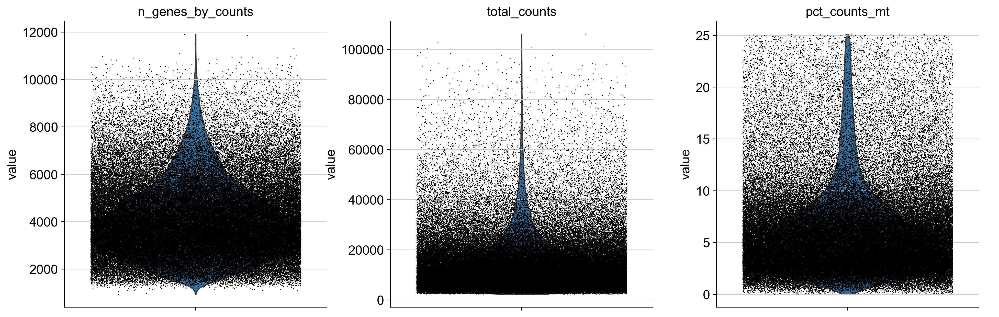

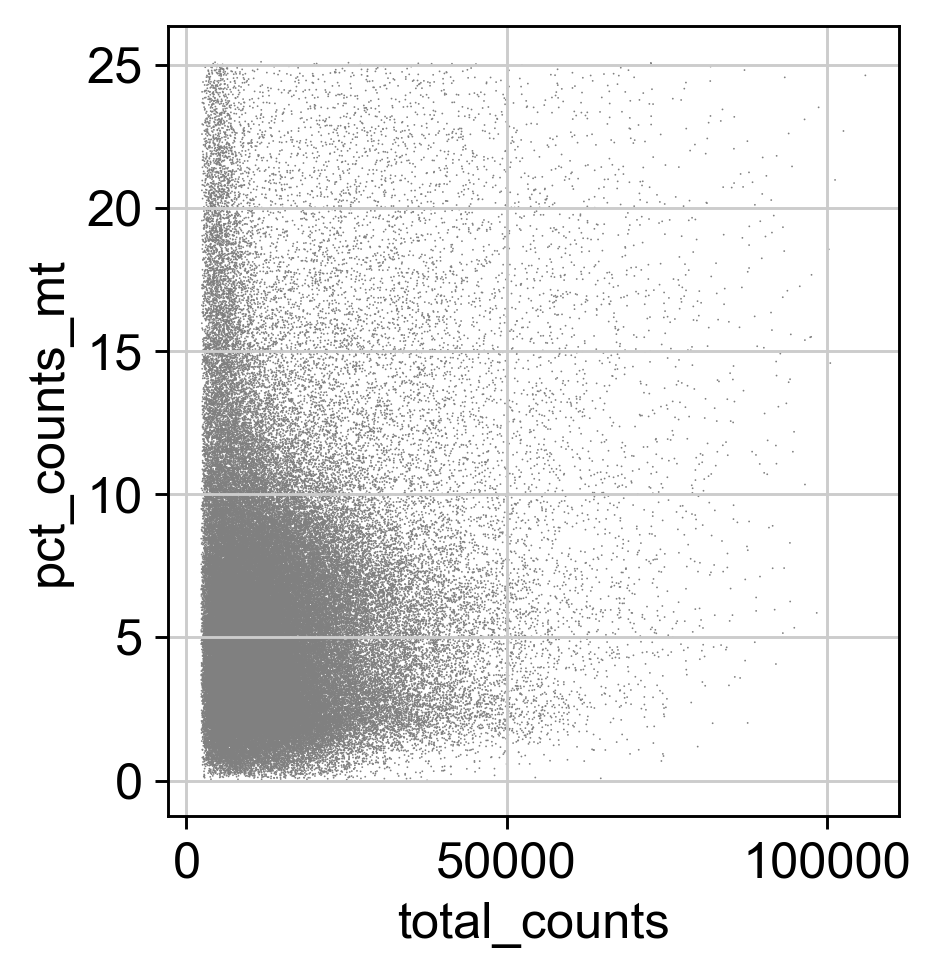

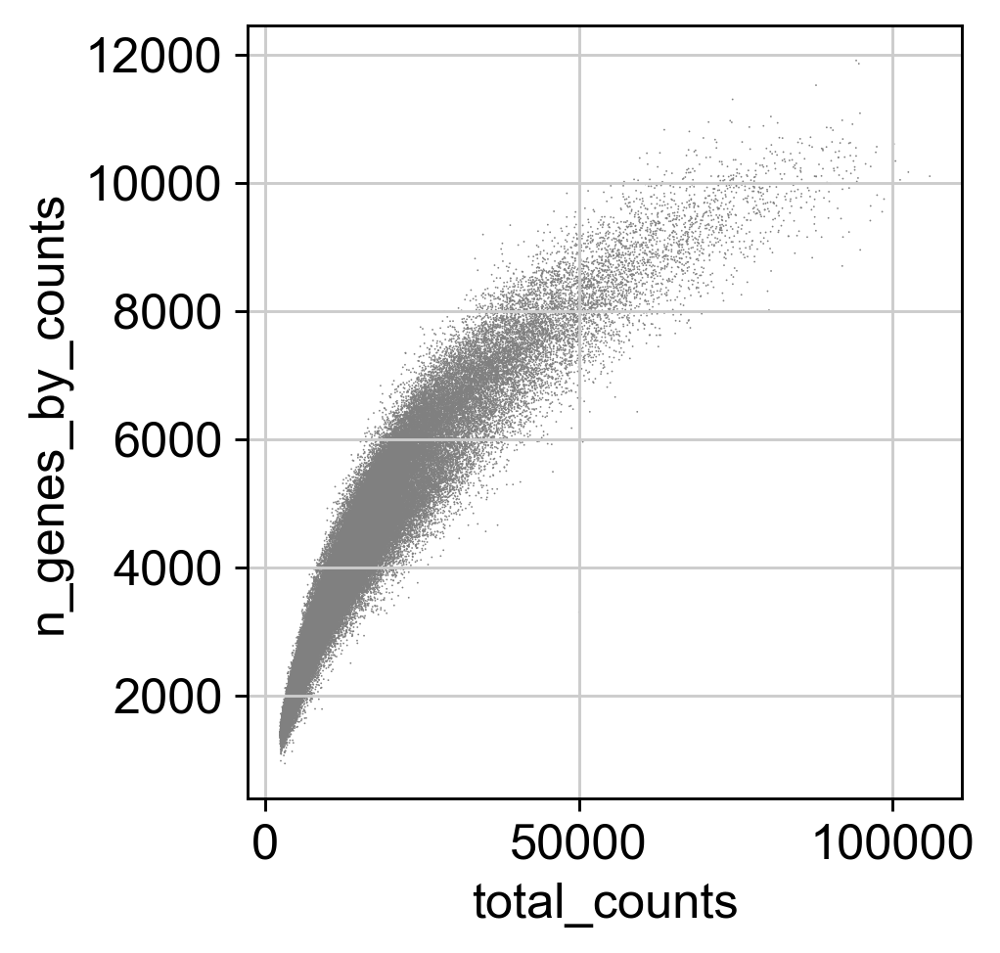

In [19]:
#Flag mitochondrial genes using gene symbols

ad_sl057_raw.var['mt'] = ad_sl057_raw.var['feature_name'].str.upper().str.startswith('MT-')
print("Number of mitochondrial genes detected:", ad_sl057_raw.var['mt'].sum())

#Recalculate per-cell QC metrics

sc.pp.calculate_qc_metrics(ad_sl057_raw, qc_vars=['mt'], inplace=True)

# Summarize distribution of mitochondrial percentages across all cells

print(ad_sl057_raw.obs['pct_counts_mt'].describe())

# Generate QC plots

qc_plots(ad_sl057_raw, tag="SL057_BEFORE_manual")

In [20]:
#Set the mitochondrial percentage cutoff to 15%

mito_thresh = 15

#Apply a filter mask

filt_mask = (ad_sl057_raw.obs.n_genes_by_counts >= 200) & (ad_sl057_raw.obs.pct_counts_mt < mito_thresh)
ad_sl057 = ad_sl057_raw[filt_mask].copy()

#Print the new dataset dimensions

print("SL057 after filter shape:", ad_sl057.shape)

SL057 after filter shape: (116143, 58234)


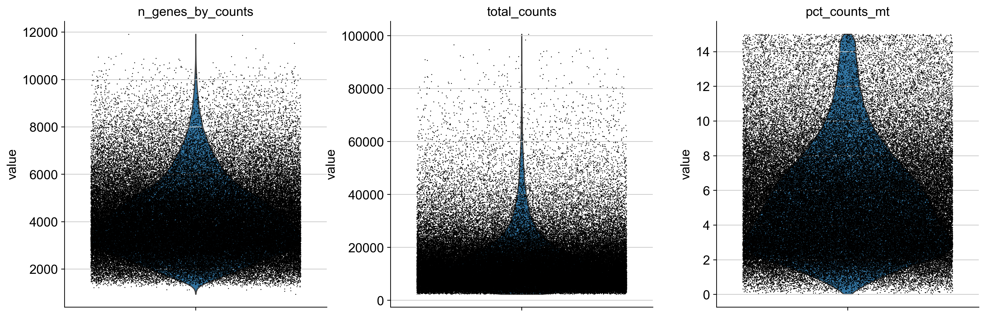

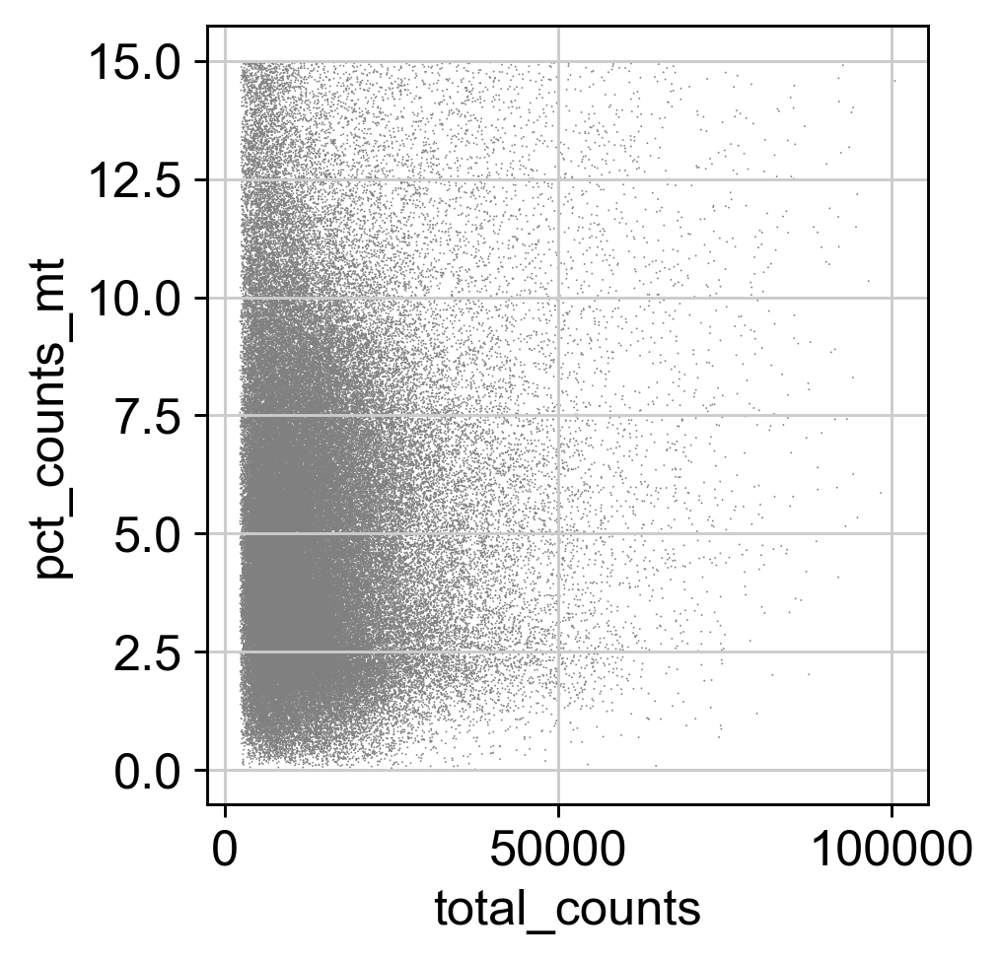

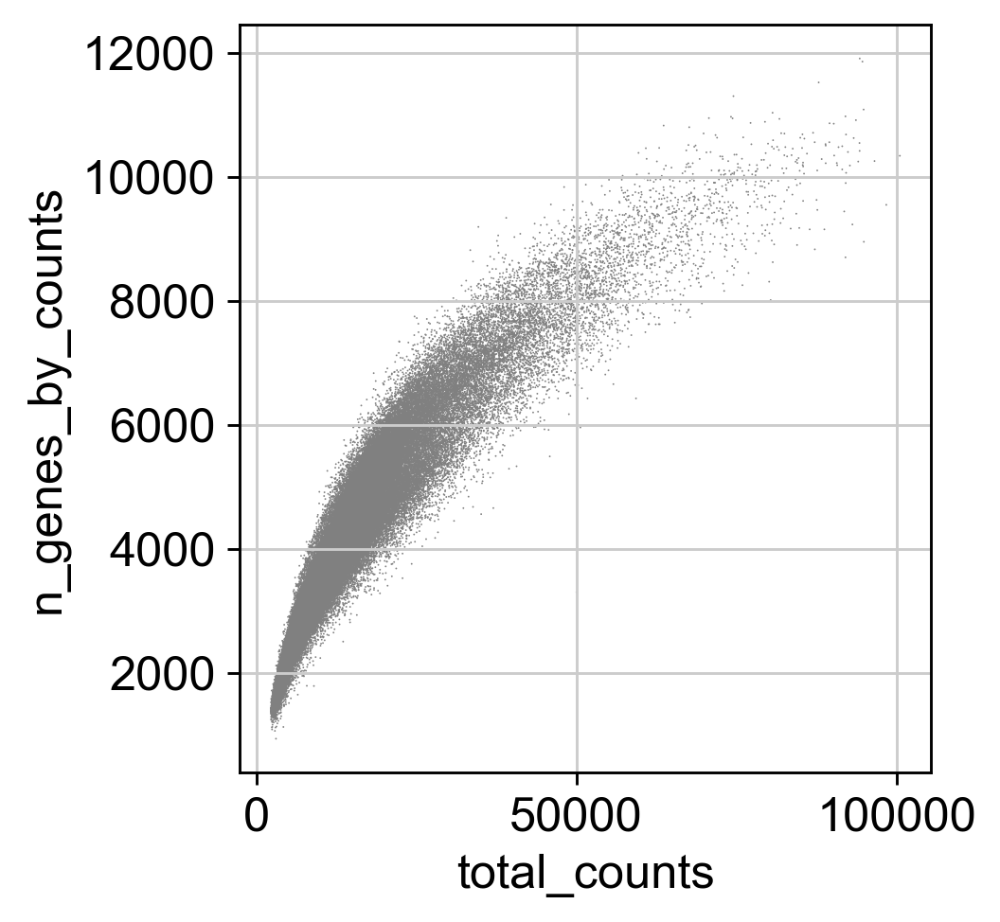

In [21]:
#Generate QC plots for filtered dataset

qc_plots(ad_sl057, tag="SL057_AFTER_manual")

normalizing counts per cell
    finished (0:00:04)
extracting highly variable genes


/Users/baileyorange/micromamba/envs/gbm_mtor/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


/Users/baileyorange/micromamba/envs/gbm_mtor/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:00:41)


2025-11-09 19:59:59,712 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-11-09 20:00:20,212 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-11-09 20:00:20,564 - harmonypy - INFO - Iteration 1 of 10
2025-11-09 20:00:45,998 - harmonypy - INFO - Iteration 2 of 10
2025-11-09 20:01:11,466 - harmonypy - INFO - Iteration 3 of 10
2025-11-09 20:01:36,807 - harmonypy - INFO - Iteration 4 of 10
2025-11-09 20:02:02,221 - harmonypy - INFO - Iteration 5 of 10
2025-11-09 20:02:27,874 - harmonypy - INFO - Iteration 6 of 10
2025-11-09 20:02:53,798 - harmonypy - INFO - Converged after 6 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:03:05)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:27)


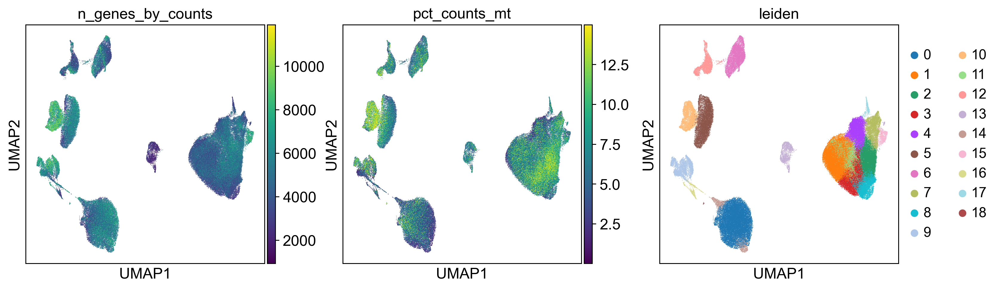

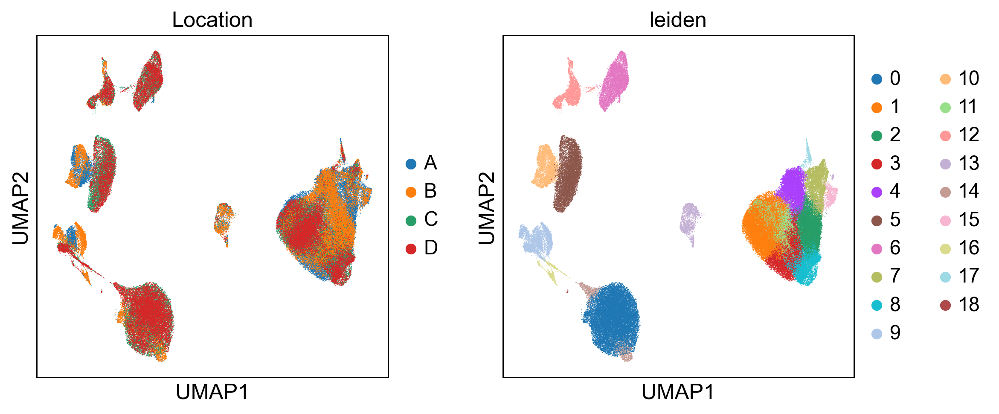

Saved: /Users/baileyorange/Desktop/GBM Project/outputs/h5ad/SL057_cleaned.h5ad


In [22]:
# Normalize and find highly variable genes

sc.pp.normalize_total(ad_sl057, target_sum=1e4)
sc.pp.log1p(ad_sl057)
sc.pp.highly_variable_genes(ad_sl057, flavor="seurat_v3", n_top_genes=4000, subset=True)

# PCA and Harmony batch correction

sc.pp.scale(ad_sl057, max_value=10)
sc.tl.pca(ad_sl057, n_comps=50)
import harmonypy as hm
key057 = detect_batch_key(ad_sl057) or "leiden"
ho057 = hm.run_harmony(ad_sl057.obsm["X_pca"], ad_sl057.obs, key057)
ad_sl057.obsm["X_pca_harmony"] = ho057.Z_corr.T

# Graph construction, UMAP, and clustering of similar cells

sc.pp.neighbors(ad_sl057, use_rep="X_pca_harmony", n_neighbors=30)
sc.tl.umap(ad_sl057); sc.tl.leiden(ad_sl057, resolution=0.8)

# Confirm clean clustering and successful batch correction

sc.pl.umap(ad_sl057, color=["n_genes_by_counts","pct_counts_mt","leiden"], save="_SL057_UMAP_qc.png")
if key057 in ad_sl057.obs:
    sc.pl.umap(ad_sl057, color=[key057,"leiden"], save="_SL057_UMAP_batchmix.png")

# Save processed dataset

sl057_out = os.path.join(H5AD_DIR, "SL057_cleaned.h5ad")
ad_sl057.write(sl057_out)
print("Saved:", sl057_out)

computing PCA
    with n_comps=50
    finished (0:07:07)


2025-11-09 20:17:21,952 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-11-09 20:18:04,562 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-11-09 20:18:06,180 - harmonypy - INFO - Iteration 1 of 10
2025-11-09 20:19:22,774 - harmonypy - INFO - Iteration 2 of 10
2025-11-09 20:20:37,894 - harmonypy - INFO - Iteration 3 of 10
2025-11-09 20:21:53,147 - harmonypy - INFO - Iteration 4 of 10
2025-11-09 20:23:09,107 - harmonypy - INFO - Iteration 5 of 10
2025-11-09 20:24:23,928 - harmonypy - INFO - Iteration 6 of 10
2025-11-09 20:25:38,484 - harmonypy - INFO - Iteration 7 of 10
2025-11-09 20:26:57,018 - harmonypy - INFO - Iteration 8 of 10
2025-11-09 20:28:12,209 - harmonypy - INFO - Converged after 8 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:52)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:06:34)
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:33)


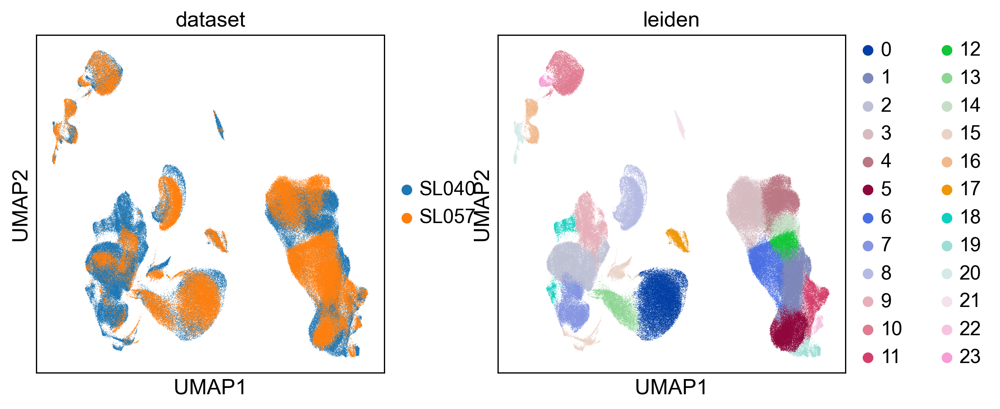

Saved combined Harmony object.


In [23]:
#Concatenate the two processed datasets

ad_comb = sc.concat([ad_sl040, ad_sl057], label="dataset", keys=["SL040","SL057"], join="outer", fill_value=0)
ad_comb.var_names_make_unique()

# Compute PCA and Harmony correction on combined data

import harmonypy as hm
sc.pp.pca(ad_comb, n_comps=50)
ho = hm.run_harmony(ad_comb.obsm["X_pca"], ad_comb.obs, "dataset")
ad_comb.obsm["X_pca_harmony"] = ho.Z_corr.T

#Build neighborhood graph, UMAP, and clusters

sc.pp.neighbors(ad_comb, use_rep="X_pca_harmony", n_neighbors=30)
sc.tl.umap(ad_comb); sc.tl.leiden(ad_comb, resolution=0.8)

#Plot the integrated UMAP

sc.pl.umap(ad_comb, color=["dataset","leiden"], save="_COMBINED_Harmony_UMAP.png")
ad_comb.write(os.path.join(H5AD_DIR, "SL040_SL057_integrated.h5ad"))
print("Saved combined Harmony object.")
     

In [ ]:
import scanpy as sc
import scvi
import os

# Combine the raw (unnormalized) datasets
ad_comb = sc.concat([ad_sl040_raw, ad_sl057_raw],
                    label="dataset",
                    keys=["SL040", "SL057"],
                    join="outer",
                    fill_value=0)
ad_comb.var_names_make_unique()

# Setup scVI on raw counts
scvi.model.SCVI.setup_anndata(ad_comb, batch_key="dataset")

# Initialize + train model
model = scvi.model.SCVI(ad_comb, n_latent=30)
model.train(max_epochs=200)


ad_comb.obsm["X_scvi"] = model.get_latent_representation()
sc.pp.neighbors(ad_comb, use_rep="X_scvi", n_neighbors=30)
sc.tl.umap(ad_comb); sc.tl.leiden(ad_comb, resolution=0.8)
sc.pl.umap(ad_comb, color=["dataset","leiden"], save="_COMBINED_scVI_UMAP.png")
ad_comb.write(os.path.join(H5AD_DIR, "SL040_SL057_scvi_integrated.h5ad"))
print("Saved combined scVI object.")

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/baileyorange/micromamba/envs/gbm_mtor/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Epoch 1/200:   0%|                                      | 0/200 [00:00<?, ?it/s]